<a href="https://colab.research.google.com/github/rtajeong/AI_Cluster_MSAC/blob/main/lab_72a_yolov5_pothole_detection_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pothole Detection with YOLOv5 (training)
- yolov5 model platform: https://github.com/ultralytics/yolov5
- for tutorial use of this yolov5 platform, see https://github.com/ultralytics/yolov5/blob/master/tutorial.ipynb
- example for Pothole detection:
  - from You-tube https://www.youtube.com/watch?v=fdWx3QV5n44
(1:09:12)


## Dataset download
- dataset in https://public.roboflow.com/object-detection/pothole
- 위 사이트에서 데이터를 Yolov5 for pytorch mode 로 다운받는다.

In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 17752, done.
remote: Counting objects: 100% (102/102), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 17752 (delta 62), reused 32 (delta 32), pack-reused 17650 (from 4)
Receiving objects: 100% (17752/17752), 17.11 MiB | 15.84 MiB/s, done.
Resolving deltas: 100% (12048/12048), done.


In [1]:
!pip install -r /content/yolov5/requirements.txt

In [2]:
%cd yolov5
!mkdir pothole

/content/yolov5
mkdir: cannot create directory ‘pothole’: File exists


In [3]:
%cd /content/yolov5/pothole

/content/yolov5/pothole


In [4]:
!curl -L "https://public.roboflow.com/ds/MUuXTYPPp0?key=uP4mgtHgJ5" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
from glob import glob

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   910  100   910    0     0   3178      0 --:--:-- --:--:-- --:--:--  3181
100 46.0M  100 46.0M    0     0  25.2M      0  0:00:01  0:00:01 --:--:-- 34.7M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg  
 extracting: test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg  
 extracting: test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg  
 extracting: test/images/img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg  
 extracting: test/images/img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg  
 extracting: test/images/img-179_jpg.rf.8632eb0d9b75fefe144829e67b75015a.jpg  
 extracting: test/images/img

In [5]:

train_img_list = glob('/content/yolov5/pothole/train/images/*.jpg')
test_img_list = glob('/content/yolov5/pothole/test/images/*.jpg')
valid_img_list = glob('/content/yolov5/pothole/valid/images/*.jpg')
print(len(train_img_list), len(test_img_list), len(valid_img_list))

465 67 133


In [6]:
!pwd

/content/yolov5/pothole


In [7]:
import yaml

with open('/content/yolov5/pothole/train.txt', 'w') as f:
    f.write('\n'.join(train_img_list) + '\n')
with open('/content/yolov5/pothole/test.txt', 'w') as f:
    f.write('\n'.join(test_img_list) + '\n')
with open('/content/yolov5/pothole/valid.txt', 'w') as f:
    f.write('\n'.join(valid_img_list) + '\n')

In [8]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [9]:
%cat /content/yolov5/pothole/data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['pothole']

In [10]:
%%writetemplate /content/yolov5/pothole/data.yaml

train: ./pothole/train/images
test: ./pothole/test/images
val: ./pothole/valid/images

nc: 1
names: ['pothole']

In [11]:
%cat /content/yolov5/pothole/data.yaml


train: ./pothole/train/images
test: ./pothole/test/images
val: ./pothole/valid/images

nc: 1
names: ['pothole']


# 모델 구성

- YOLOv5는 nc 값에 따라 Detection Head의 마지막 레이어 출력 채널 수를 자동으로 조정함
- COCO용은 nc=80 → 출력 채널 수가 85 (x,y,w,h,objectness + 80 classes)
- 커스텀 1 클래스면 nc=1 → 출력 채널 수가 7 (x,y,w,h,objectness + 1 classes)

In [12]:
import yaml

with open('/content/yolov5/pothole/data.yaml', 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, 

In [13]:
num_classes = 1

In [14]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [15]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

## Training
- img: 입력 이미지 크기 (640*640 으로 resize)
- batch
- epochs
- data: 데이터셋 설정 파일 경로 (클래스 이름, 학습/검증 이미지 경로)
- cfg: 모델 구성 지정 (network structure and weights)
- weights: 가중치에 대한 경로 지정: '' -> 사전 학습된 가중치를 쓰지 않고 scratch 학습을 하겠다는 의미라서, 데이터셋이 충분히 크지 않으면 성능
- name: 결과 저장 폴
- nosave: 최종 체크포인트만 지정
- cache: 빠른 학습을 위한 이미지 캐시

In [16]:
%%time
%cd /content/yolov5
!python train.py --img 640 --batch 32 --epochs 100 --data ./pothole/data.yaml \
  --cfg ./models/custom_yolov5s.yaml --weights '' --name pothole_results --cache

/content/yolov5
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-12-02 07:01:16.711557: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764658876.731190    2524 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764658876.737099    2524 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for 

In [17]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [18]:
# 결과 보기
!ls /content/yolov5/runs/train/pothole_results/

confusion_matrix.png				    results.png
events.out.tfevents.1764658912.9eb209cd20a7.2524.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
hyp.yaml					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
opt.yaml					    val_batch1_labels.jpg
P_curve.png					    val_batch1_pred.jpg
PR_curve.png					    val_batch2_labels.jpg
R_curve.png					    val_batch2_pred.jpg
results.csv					    weights


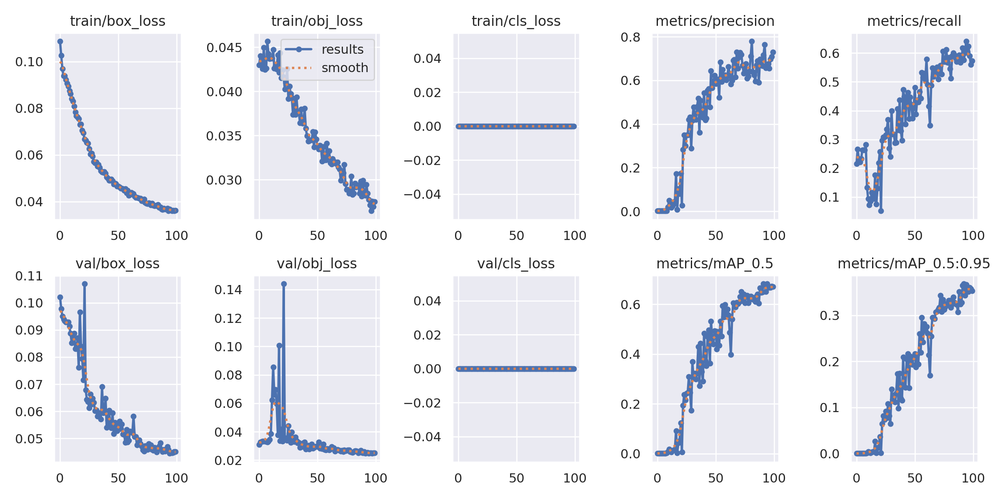

In [19]:
from IPython.display import Image, display
Image(filename='/content/yolov5/runs/train/pothole_results/results.png', width=1000)

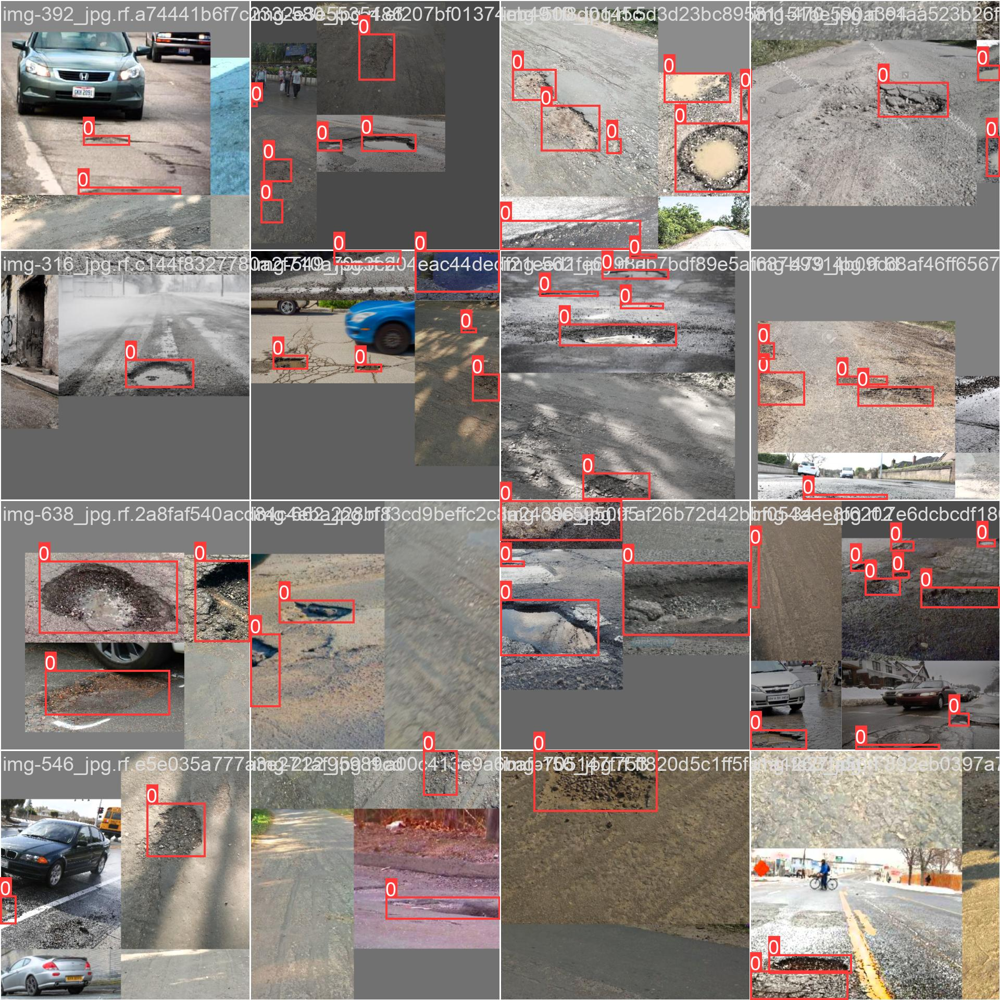

In [20]:
Image(filename='/content/yolov5/runs/train/pothole_results/train_batch0.jpg', width=1000)

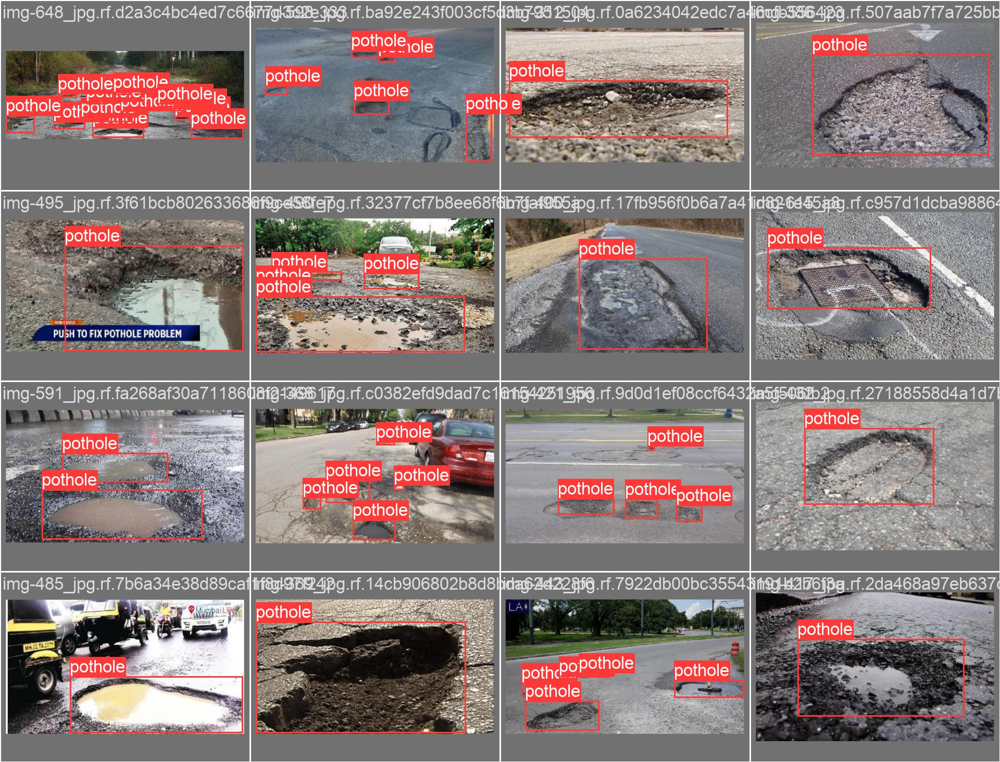

In [ ]:
Image(filename='/content/yolov5/runs/train/pothole_results/val_batch0_labels.jpg', width=1000)

## Validation

- \-\-iou 0.65: NMS(Non-Maximum Suppression)에서 IoU 임계값을 0.65로 설정. 박스가 겹칠 때 IoU가 0.65 이상이면 중복으로 판단해 제거
- \-\-half: FP16(half precision) 모드로 평가 → GPU 메모리 절약, 속도 향상

In [21]:
!python val.py --weights runs/train/pothole_results/weights/best.pt --data ./pothole/data.yaml --img 640 --iou 0.65 --half

val: data=./pothole/data.yaml, weights=['runs/train/pothole_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-450-g781b9d57 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/pothole/valid/labels.cache... 133 images, 0 backgrounds, 0 corrupt: 100% 133/133 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 5/5 [00:06<00:00,  1.22s/it]
                   all        133        330      0.752      0.579      0.672      0.367
Speed: 0.3ms pre-process, 14.0ms inference, 5.6ms NMS per image at shape (32, 3, 640, 640)
Results

- \-\-task test: data.yaml에 정의된 test 데이터셋을 대상으로 평가

In [22]:
!python val.py --weights runs/train/pothole_results/weights/best.pt --data ./pothole/data.yaml --img 640 --task test

val: data=./pothole/data.yaml, weights=['runs/train/pothole_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-450-g781b9d57 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/yolov5/pothole/test/labels... 67 images, 0 backgrounds, 0 corrupt: 100% 67/67 [00:00<00:00, 440.13it/s]
test: New cache created: /content/yolov5/pothole/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 3/3 [00:02<00:00,  1.21it/s]
                   all         67        154      0.763      0.604      0.669      0.336
Speed: 0.3ms pre-process, 9.0m

## 추론 (Prediction)


In [23]:
%ls runs/train/pothole_results/weights

best.pt  last.pt


In [24]:
!python detect.py --weights runs/train/pothole_results/weights/best.pt --img 640 --conf 0.4 --source ./pothole/test/images

detect: weights=['runs/train/pothole_results/weights/best.pt'], source=./pothole/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-450-g781b9d57 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/67 /content/yolov5/pothole/test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg: 640x640 1 pothole, 11.4ms
image 2/67 /content/yolov5/pothole/test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg: 640x640 1 pothole, 11.4ms
image 3/67 /content/yolov5/pothole/test/

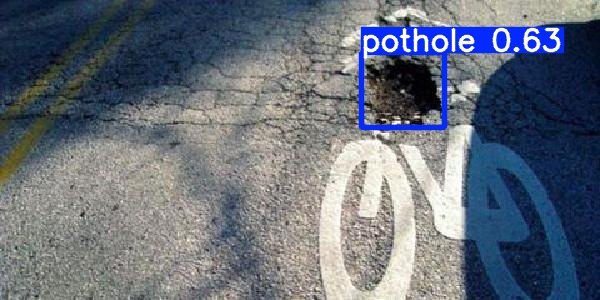

In [25]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp/*.jpg'))
display(Image(filename=image_name))

## 모델 내보내기

In [26]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [27]:
!ls /content/drive/MyDrive/Colab\ Notebooks/U_MSAC_KPC

 best.pt
 gg_104_경사하강법.ipynb
 gg_105_당뇨병_기초_회귀_예측.ipynb
 gg_105_더미데이터_기초_분류_rev2.ipynb
 gg_106_결정트리_붓꽃_분류.ipynb
 gg_106_결정트리_유방암_분류.ipynb
 gg_115_MNIST_손글씨_인식_모델_rev1.ipynb
'gg_121_개선된_MNIST_손글씨_인식_모델_(CNN)_rev1.ipynb'
 gg_122_CNN_이미지_분류_모델_v1.ipynb
 gg_136_RNN_시계열_데이터_날씨_예측.ipynb
'gg_141_이미지_객체_인식_탐지_모델_1_(Faster_R-CNN)_2025.ipynb'
'gg_151_이미지_객체_인식_탐지_모델_2_(YOLOv3).ipynb'
'gg_161_동영상_객체_추적_모델_(YOLOv4,DeepSORT)_ing.ipynb'
 gg_29_GD_regression_classification_rev3.ipynb
 gg_93_1_OpenCV_얼굴인식_v1.ipynb
 gg_93_2_OpenCV_손글씨_인식_v1.ipynb
 gg_94_1_OpenCV_이미지_윤곽_추출.ipynb
 gg_94_2_OpenCV_우편번호_읽기_v2.ipynb
 gg_95_OpenCV_동영상처리_rev2.ipynb
 lab_06_keras_mlp_cnn_rnn_rev3.ipynb
 lab_61_cats_and_dogs_transfer_2025.ipynb
 lab_72a_yolov5_pothole_detection_training.ipynb
 lab_72c_yolov5_training_example.ipynb
 l

In [28]:
# 훈련된 모델 저장
%cp /content/yolov5/runs/train/pothole_results/weights/best.pt /content/drive/MyDrive/Colab\ Notebooks/U_MSAC_KPC

In [29]:
!ls -l /content/drive/MyDrive/Colab\ Notebooks/U_MSAC_KPC

total 77851
-rw------- 1 root root 14389487 Dec  2 07:26  best.pt
-rw------- 1 root root   106180 Nov 18 11:07  gg_104_경사하강법.ipynb
-rw------- 1 root root   368363 Nov  1  2024  gg_105_당뇨병_기초_회귀_예측.ipynb
-rw------- 1 root root    80467 Nov  1  2024  gg_105_더미데이터_기초_분류_rev2.ipynb
-rw------- 1 root root   101594 Nov  3  2024  gg_106_결정트리_붓꽃_분류.ipynb
-rw------- 1 root root   214399 Nov  1  2024  gg_106_결정트리_유방암_분류.ipynb
-rw------- 1 root root    42840 Nov 25 12:32  gg_115_MNIST_손글씨_인식_모델_rev1.ipynb
-rw------- 1 root root   140362 Nov 25 12:00 'gg_121_개선된_MNIST_손글씨_인식_모델_(CNN)_rev1.ipynb'
-rw------- 1 root root  1269245 Nov 26 12:08  gg_122_CNN_이미지_분류_모델_v1.ipynb
-rw------- 1 root root   402543 Nov 25 07:23  gg_136_RNN_시계열_데이터_날씨_예측.ipynb
-rw------- 1 root root  2084974 Dec  2 05:38 'gg_141_이미지_객체_인식_탐지_모델_1_(Faster_R-CNN)_2025.ipynb'
-rw------- 1 root root  1287647 No

# Exercise
- see the difference between json, xml, and yaml at https://rfriend.tistory.com/540

In [ ]:
%%writefile vegetables.yml
Vegetables:
  - pepper
  - tomato
  - garlic

Writing vegetables.yml


In [ ]:
import yaml

with open('vegetables.yml') as f:
    vegetables = yaml.load(f, Loader=yaml.FullLoader)
    print(vegetables)

{'Vegetables': ['pepper', 'tomato', 'garlic']}


In [ ]:
yaml.dump(vegetables)

'Vegetables:\n- pepper\n- tomato\n- garlic\n'

In [ ]:
from glob import glob
glob('/content/yolov5/*.py')

['/content/yolov5/export.py',
 '/content/yolov5/train.py',
 '/content/yolov5/val.py',
 '/content/yolov5/hubconf.py',
 '/content/yolov5/benchmarks.py',
 '/content/yolov5/detect.py']